<a href="https://colab.research.google.com/github/GiX007/llm-from-scratch/blob/main/03_gpt_model_from_scratch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementation of a GPT model from scratch

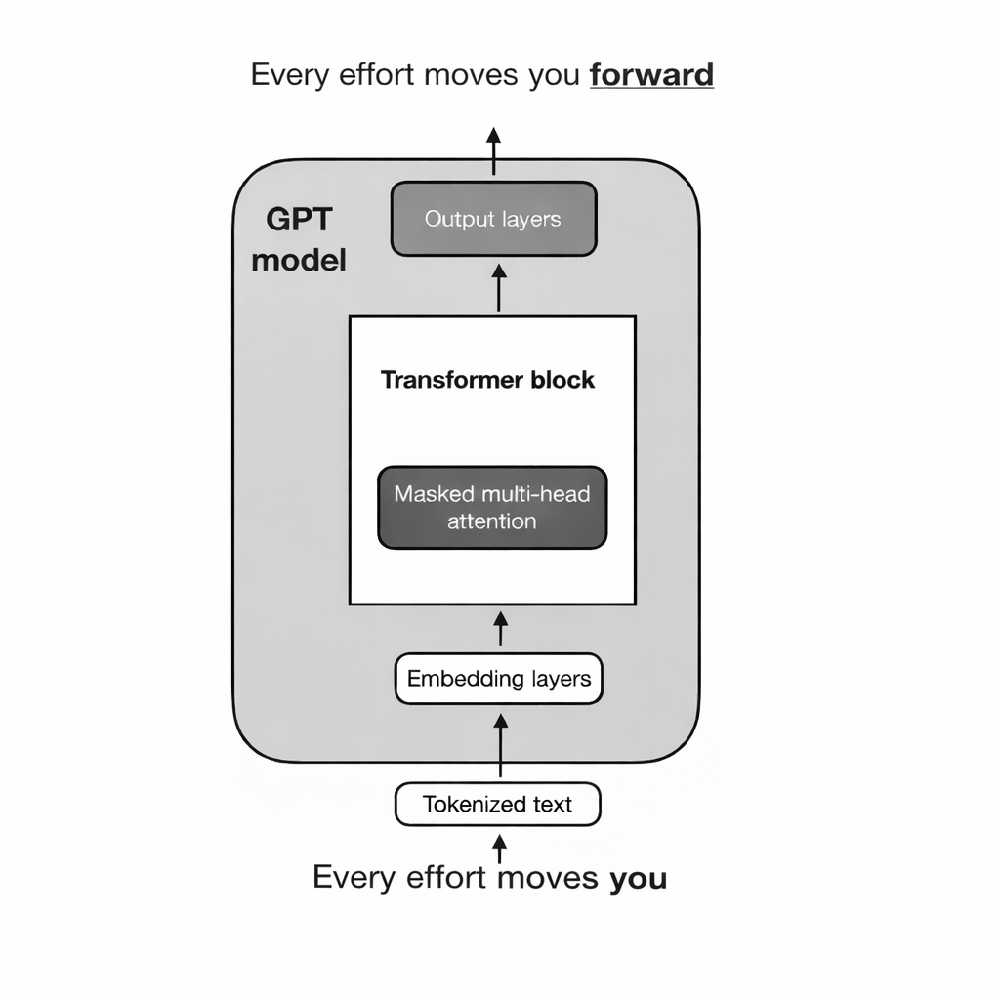

In [ ]:
GPT_CONFIG_124M = {
    "vocab_size": 50257, # vocabulary size
    "context_length": 1024, # context length
    "emb_dim": 768, # embedding dimension
    "n_heads": 12, # number of attention heads
    "n_layers": 12, # number of layers
    "drop_rate": 0.1, # dropout rate
    "qkv_bias": False # query-Key-Value bias
}

In [ ]:
import torch
import torch.nn as nn

## Components

### GPT backbone

In [ ]:
# for the task of generating text
class DummyGPTModel(nn.Module):

  def __init__(self, cfg):
    super().__init__()
    self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])
    self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])
    self.drop_emb = nn.Dropout(cfg["drop_rate"])
    self.trf_blocks = nn.Sequential(*[DummyTransformerBlock(cfg) for _ in range(cfg["n_layers"])])
    self.final_norm = DummyLayerNorm(cfg["emb_dim"])
    self.out_head = nn.Linear(cfg["emb_dim"], cfg["vocab_size"], bias=False) # notice the output here is of opposite shape of the output in the input layer

  def forward(self, in_idx):
    batch_size, seq_len = in_idx.shape
    tok_embeds = self.tok_emb(in_idx)
    pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))
    x = tok_embeds + pos_embeds
    x = self.drop_emb(x)
    x = self.trf_blocks(x)
    x = self.final_norm(x)
    logits = self.out_head(x)
    return logits

class DummyTransformerBlock(nn.Module):

  def __init__(self, cfg):
    super().__init__()
    # a simple placeholder

  def forward(self, x):
    # this block does nothing and just returns its input
    return x

class DummyLayerNorm(nn.Module):

  def __init__(self, normalized_shape, eps=1e-5):
    super().__init__()
    # the parameters here are just to mimic the LayerNorm interface.

  def forward(self, x):
    # this layer does nothing and just returns its input.
    return x

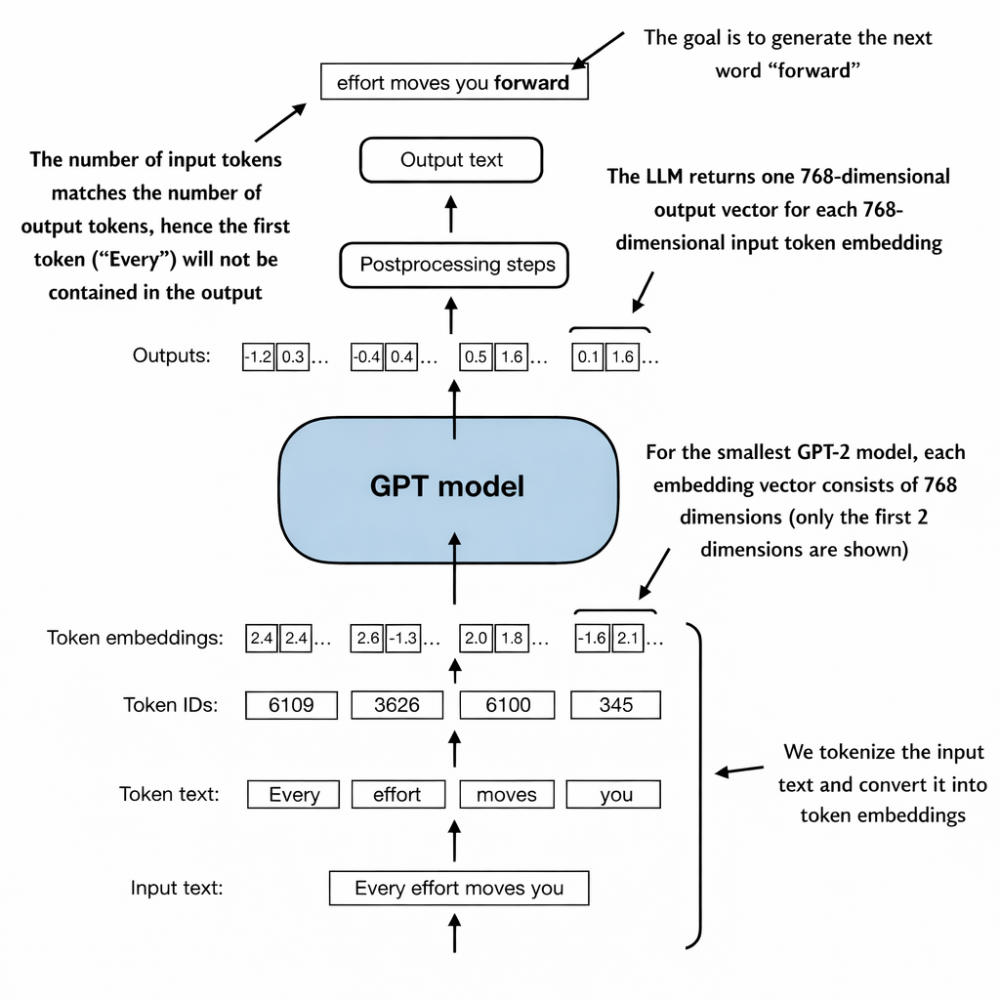

In [ ]:
import tiktoken

tokenizer = tiktoken.get_encoding("gpt2")

batch = []

txt1 = "Every effort moves you"
txt2 = "Every day holds a"

batch.append(torch.tensor(tokenizer.encode(txt1)))
batch.append(torch.tensor(tokenizer.encode(txt2)))
batch = torch.stack(batch, dim=0)
print("Batch shape:", batch.shape)
print(batch)

Batch shape: torch.Size([2, 4])
tensor([[6109, 3626, 6100,  345],
        [6109, 1110, 6622,  257]])


In [ ]:
# test the dummy GPT
torch.manual_seed(42)
model = DummyGPTModel(GPT_CONFIG_124M)

logits = model(batch) # goal: to get optimized these logits after training (next notebook)
print("Output shape:", logits.shape)
print(logits)

Output shape: torch.Size([2, 4, 50257])
tensor([[[ 0.1597,  0.1958, -0.1044,  ...,  0.0555,  0.4726, -0.5874],
         [-0.7750,  0.5466, -1.2552,  ..., -0.2906,  0.1688,  0.4970],
         [-0.9552, -1.1343,  0.4898,  ..., -0.0489, -0.2273,  0.1706],
         [ 1.3697, -0.8169, -0.2184,  ...,  0.9854,  0.4593,  0.6592]],

        [[ 0.8104, -0.2729, -0.0559,  ...,  0.3231,  0.6338, -1.0197],
         [-0.5044,  0.9103, -1.0994,  ..., -0.4777,  0.5505, -0.5228],
         [-0.5149,  0.4777,  1.1838,  ..., -1.0277, -0.6529, -0.0847],
         [ 0.9222,  0.3893, -0.4700,  ...,  0.3818,  0.5648,  1.9670]]],
       grad_fn=<UnsafeViewBackward0>)


### Layer Normalization

Layer normalization is used in GPT to keep the activations and gradients stable as the model gets very deep and processes long text. Transformers rely heavily on residual connections, which can easily make values explode or vanish; LayerNorm keeps them in a steady range so training stays smooth and fast. It works on each token independently, so it doesn't depend on batch size or sequence length. That's why it's better than BatchNorm: BatchNorm needs big, stable batches and averages across them, but GPT often runs with variable sequence lengths and very small per-device batch sizes (because GPTs are trained in a highly distributed way with micro-batching, pipeline/model parallelism, so each GPU only sees a few samples). So LayerNorm is simpler, more stable, and more reliable for large language models.

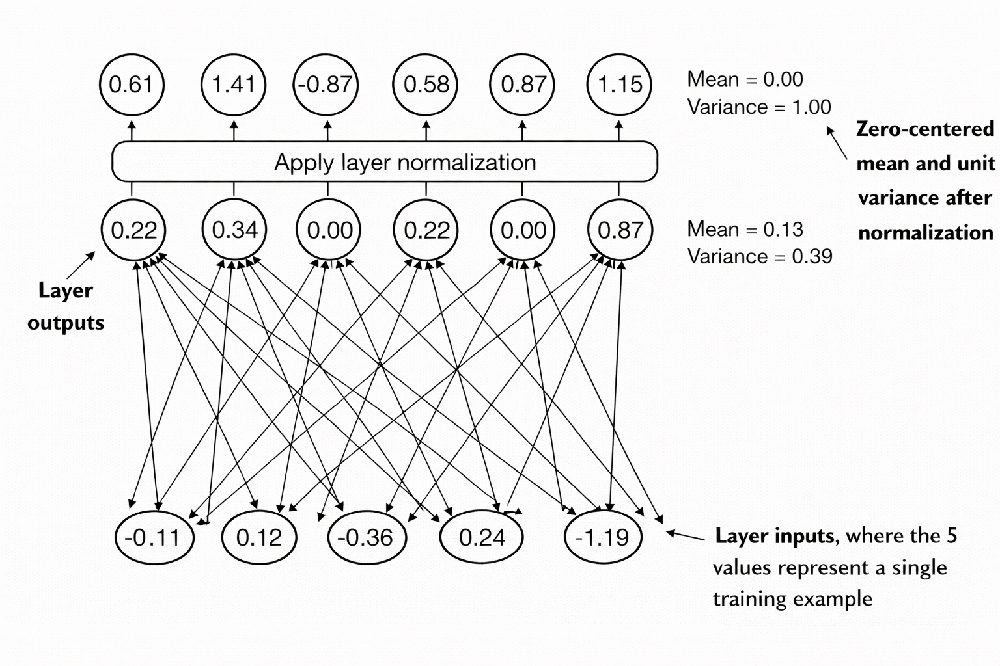

In [ ]:
torch.manual_seed(42)

# create 2 training examples with 5 dimensions (features) each
batch_example = torch.randn(2, 5)
print("Input:", batch_example, batch_example.shape)

layer = nn.Sequential(nn.Linear(5, 6), nn.ReLU())
out = layer(batch_example)
print("\nOutput:", out, out.shape)

Input: tensor([[ 0.3367,  0.1288,  0.2345,  0.2303, -1.1229],
        [-0.1863,  2.2082, -0.6380,  0.4617,  0.2674]]) torch.Size([2, 5])

Output: tensor([[0.0000, 0.1842, 0.0052, 0.7233, 0.0000, 0.5298],
        [0.0000, 0.0000, 0.0000, 0.2237, 0.0000, 0.7727]],
       grad_fn=<ReluBackward0>) torch.Size([2, 6])


In [ ]:
# compute mean and varianace of the output
mean = out.mean(dim=-1, keepdim=True)
var = out.var(dim=-1, keepdim=True)

print("Mean:\n", mean)
print("Variance:\n", var)

Mean:
 tensor([[0.2404],
        [0.1661]], grad_fn=<MeanBackward1>)
Variance:
 tensor([[0.0982],
        [0.0963]], grad_fn=<VarBackward0>)


In [ ]:
# manual sanity check
manual_mean1 = (0.0000+0.1842+0.0052+0.7233+0.0000+0.5298) / 6

# overall_mean = out.mean() # this is the mean of all elements

N = out.shape[1]
manual_mean = out.sum(dim=-1, keepdim=True) / N # sum / N, shape: (2,1)
manual_var = ((out - manual_mean)**2).sum(dim=-1, keepdim=True) / (N - 1) # sum((x - mean)^2) / (N-1),

print(manual_mean1)
print(manual_mean)
print(manual_var)

0.2404166666666667
tensor([[0.2404],
        [0.1661]], grad_fn=<DivBackward0>)
tensor([[0.0982],
        [0.0963]], grad_fn=<DivBackward0>)


In [ ]:
# normalize out
out_norm = (out - mean) / torch.sqrt(var)
print("Normalized layer outputs:\n", out_norm)

mean = out_norm.mean(dim=-1, keepdim=True)
var = out_norm.var(dim=-1, keepdim=True)
print("Mean:\n", mean) # should be 0
print("Variance:\n", var) # should be 1

Normalized layer outputs:
 tensor([[-0.7672, -0.1794, -0.7506,  1.5410, -0.7672,  0.9234],
        [-0.5351, -0.5351, -0.5351,  0.1857, -0.5351,  1.9546]],
       grad_fn=<DivBackward0>)
Mean:
 tensor([[0.0000e+00],
        [7.4506e-09]], grad_fn=<MeanBackward1>)
Variance:
 tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


In [ ]:
# to improve readability, we can disable PyTorch's scientific notation
torch.set_printoptions(sci_mode=False)
print("Mean:\n", mean)
print("Variance:\n", var)

Mean:
 tensor([[0.0000],
        [0.0000]], grad_fn=<MeanBackward1>)
Variance:
 tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


In [ ]:
class LayerNorm(nn.Module):

  def __init__(self, emb_dim):
    super().__init__()
    self.eps = 1e-5
    self.scale = nn.Parameter(torch.ones(emb_dim))
    self.shift = nn.Parameter(torch.zeros(emb_dim))

  def forward(self, x):
    mean = x.mean(dim=-1, keepdim=True)
    var = x.var(dim=-1, keepdim=True, unbiased=False)
    norm_x = (x - mean) / torch.sqrt(var + self.eps)
    return self.scale * norm_x + self.shift

In [ ]:
ln = LayerNorm(emb_dim=5)
out_ln = ln(batch_example)

In [ ]:
mean = out_ln.mean(dim=-1, keepdim=True)
var = out_ln.var(dim=-1, unbiased=False, keepdim=True)

print("Mean:\n", mean)
print("Variance:\n", var)

Mean:
 tensor([[-0.0000],
        [ 0.0000]], grad_fn=<MeanBackward1>)
Variance:
 tensor([[1.0000],
        [1.0000]], grad_fn=<VarBackward0>)


### GELU activation

In [ ]:
class GELU(nn.Module):

  def __init__(self):
    super().__init__()

  def forward(self, x):
    return 0.5 * x * (1 + torch.tanh(torch.sqrt(torch.tensor(2.0 / torch.pi)) * (x + 0.044715 * torch.pow(x, 3)) ))

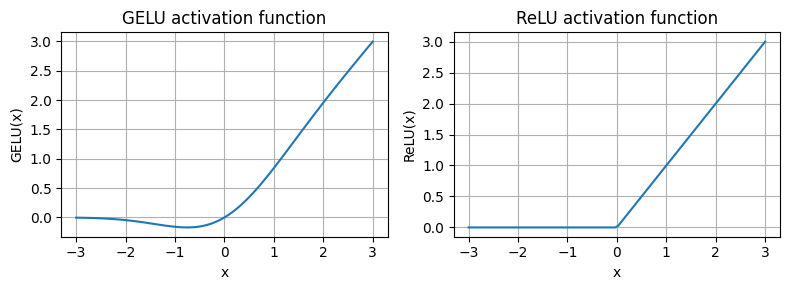

In [ ]:
import matplotlib.pyplot as plt

gelu, relu = GELU(), nn.ReLU()

# some sample data
x = torch.linspace(-3, 3, 100)
y_gelu, y_relu = gelu(x), relu(x)

plt.figure(figsize=(8, 3))
for i, (y, label) in enumerate(zip([y_gelu, y_relu], ["GELU", "ReLU"]), 1):
  plt.subplot(1, 2, i)
  plt.plot(x, y)
  plt.title(f"{label} activation function")
  plt.xlabel("x")
  plt.ylabel(f"{label}(x)")
  plt.grid(True)

plt.tight_layout()
plt.show()

### Feed Forward Network

In [ ]:
class FeedForward(nn.Module):

  def __init__(self, cfg):
    super().__init__()
    self.layers = nn.Sequential(
        nn.Linear(cfg["emb_dim"], 4 * cfg["emb_dim"]), # 4 because of original GPT architecture
        GELU(),
        nn.Linear(4 * cfg["emb_dim"], cfg["emb_dim"]),
        )

  def forward(self, x):
    return self.layers(x)

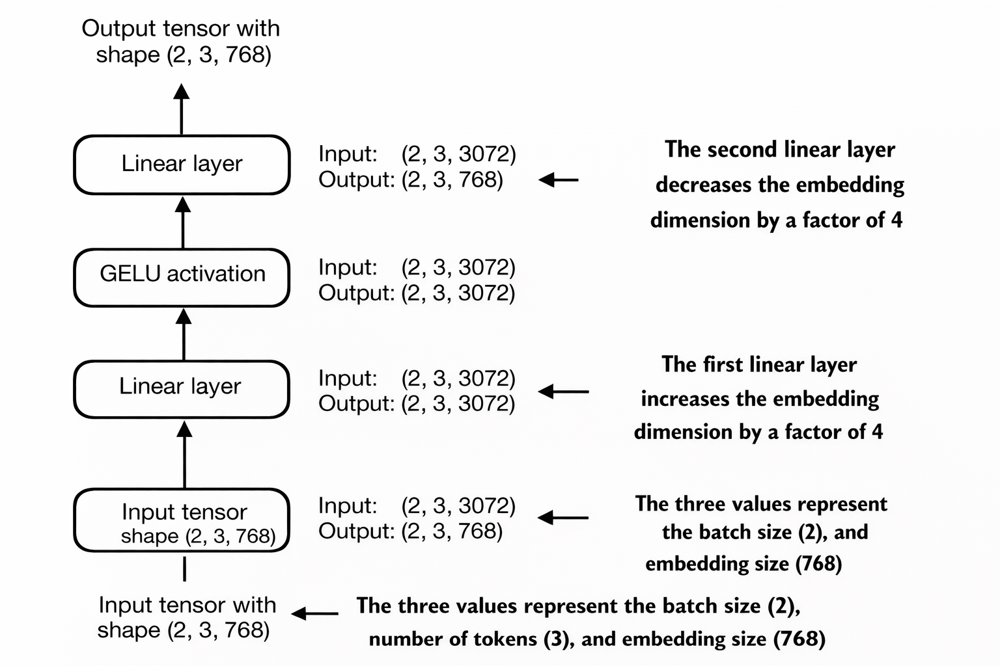

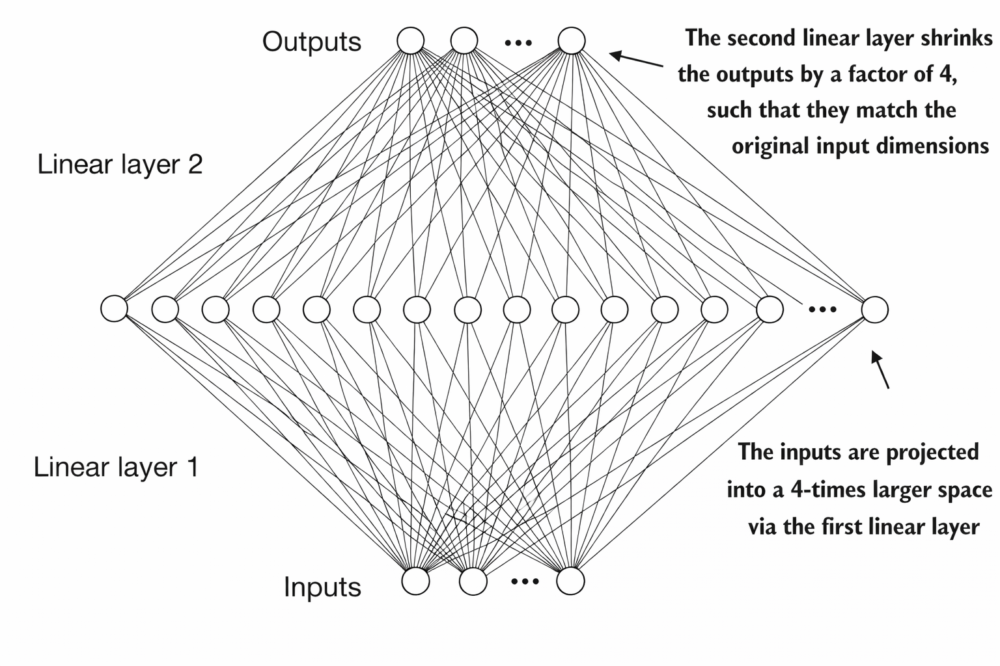

In [ ]:
print(GPT_CONFIG_124M["emb_dim"])

768


In [ ]:
ffn = FeedForward(GPT_CONFIG_124M)

# input shape: (batch_size, num_token, emb_size)
x = torch.rand(2, 3, 768)
out = ffn(x)
print(out.shape)
# print(out)

torch.Size([2, 3, 768])


### Shortcut connections

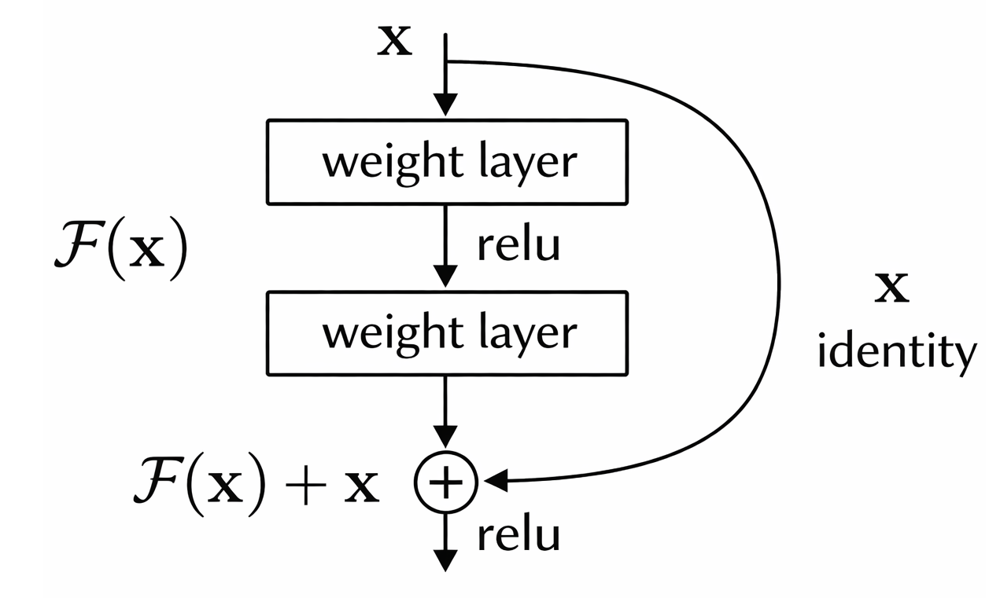

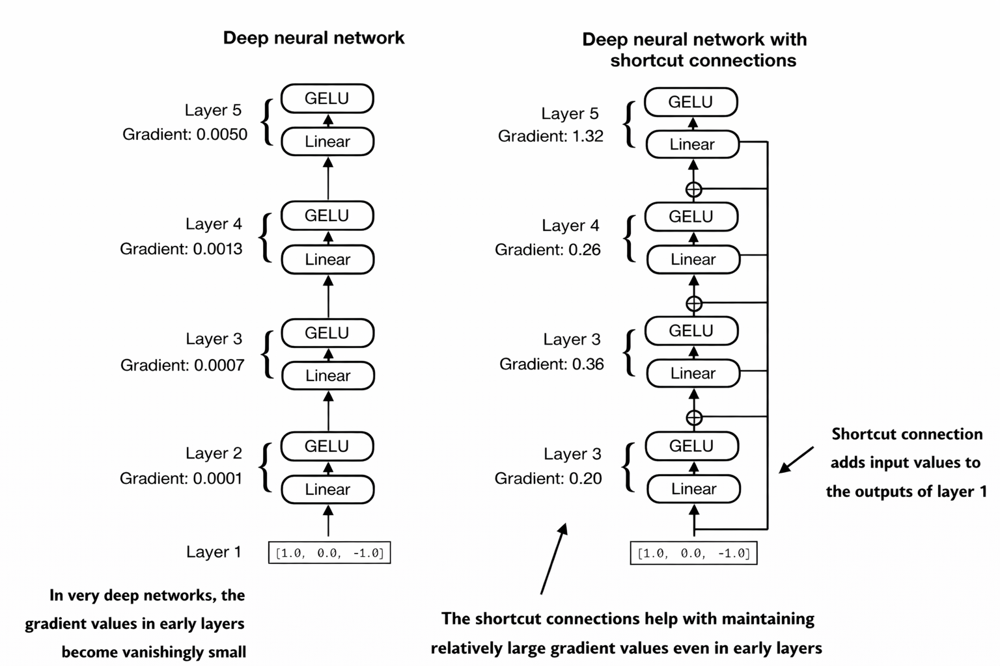

In [ ]:
class ExampleDeepNeuralNetwork(nn.Module):

  def __init__(self, layer_sizes, use_shortcut):
    super().__init__()
    self.use_shortcut = use_shortcut
    self.layers = nn.ModuleList([
        nn.Sequential(nn.Linear(layer_sizes[0], layer_sizes[1]), GELU()),
        nn.Sequential(nn.Linear(layer_sizes[1], layer_sizes[2]), GELU()),
        nn.Sequential(nn.Linear(layer_sizes[2], layer_sizes[3]), GELU()),
        nn.Sequential(nn.Linear(layer_sizes[3], layer_sizes[4]), GELU()),
        nn.Sequential(nn.Linear(layer_sizes[4], layer_sizes[5]), GELU())
        ])

  def forward(self, x):
    for layer in self.layers:
      # compute the output of the current layer
      layer_output = layer(x)
      # check if shortcut can be applied
      if self.use_shortcut and x.shape == layer_output.shape:
        x = x + layer_output
      else:
        x = layer_output
    return x

def print_gradients(model, x):
  # forward pass
  output = model(x)
  target = torch.tensor([[0.]])

  # calculate loss based on how close the target and output are
  loss = nn.MSELoss()
  loss = loss(output, target)

  # backward pass to calculate the gradients
  loss.backward()

  for name, param in model.named_parameters():
    if 'weight' in name:
      # print the mean absolute gradient of the weights
      print(f"{name} has gradient mean of {param.grad.abs().mean().item()}")

In [ ]:
# gradient values without shortcut connections
layer_sizes = [3, 3, 3, 3, 3, 1]

sample_input = torch.tensor([[1., 0., -1.]])

torch.manual_seed(123)
model_without_shortcut = ExampleDeepNeuralNetwork(layer_sizes, use_shortcut=False)
print_gradients(model_without_shortcut, sample_input)

layers.0.0.weight has gradient mean of 0.00020173584925942123
layers.1.0.weight has gradient mean of 0.00012011159560643137
layers.2.0.weight has gradient mean of 0.0007152040489017963
layers.3.0.weight has gradient mean of 0.0013988736318424344
layers.4.0.weight has gradient mean of 0.005049645435065031


In [ ]:
# gradient values with shortcut connections
torch.manual_seed(123)
model_with_shortcut = ExampleDeepNeuralNetwork(layer_sizes, use_shortcut=True)
print_gradients(model_with_shortcut, sample_input) # notice that the shortcut connections prevent the gradients from vanishing in the early layers (towards layer.0)

layers.0.0.weight has gradient mean of 0.22169791162014008
layers.1.0.weight has gradient mean of 0.20694105327129364
layers.2.0.weight has gradient mean of 0.32896995544433594
layers.3.0.weight has gradient mean of 0.2665732204914093
layers.4.0.weight has gradient mean of 1.3258540630340576


### Transformer block

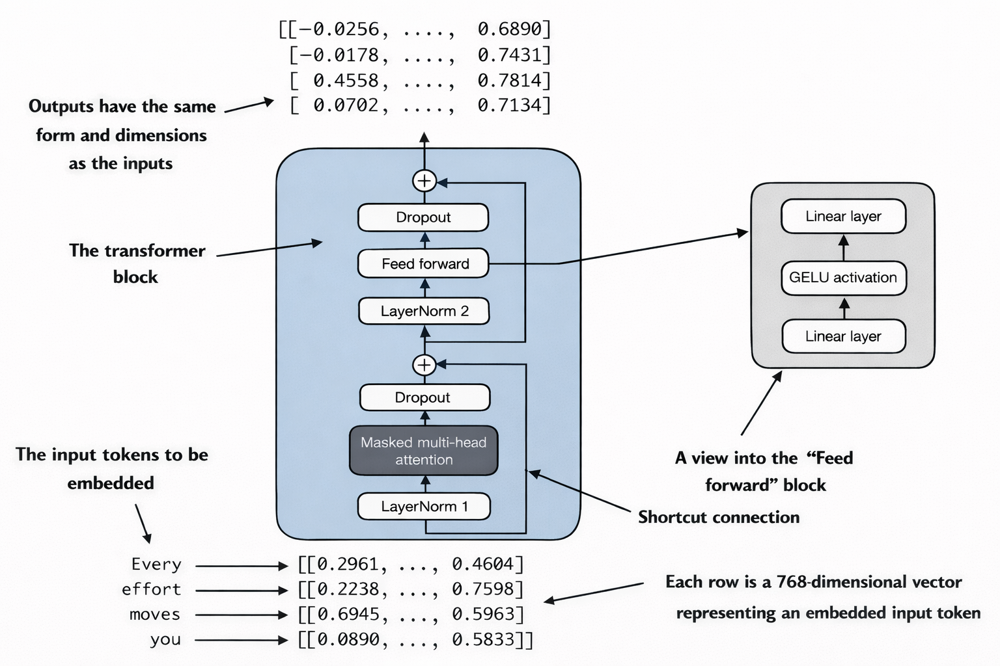

In [ ]:
from utils import MultiHeadAttention

class TransformerBlock(nn.Module):

  def __init__(self, cfg):
    super().__init__()
    self.att = MultiHeadAttention(
        d_in=cfg["emb_dim"],
        d_out=cfg["emb_dim"],
        context_length=cfg["context_length"],
        num_heads=cfg["n_heads"],
        dropout=cfg["drop_rate"],
        qkv_bias=cfg["qkv_bias"]
        )
    self.ff = FeedForward(cfg)
    self.norm1 = LayerNorm(cfg["emb_dim"])
    self.norm2 = LayerNorm(cfg["emb_dim"])
    self.drop_shortcut = nn.Dropout(cfg["drop_rate"])

  def forward(self, x):
    # shortcut connection for attention block
    shortcut = x
    x = self.norm1(x)
    x = self.att(x) # (batch_size, num_tokens, emb_size)
    x = self.drop_shortcut(x)
    x = x + shortcut # add the original input back

    # shortcut connection for feed forward block
    shortcut = x
    x = self.norm2(x)
    x = self.ff(x)
    x = self.drop_shortcut(x)
    x = x + shortcut # add the original input back

    return x

In [ ]:
torch.manual_seed(42)

x = torch.rand(2, 4, 768) # (batch_size, num_tokens, emb_dim)
block = TransformerBlock(GPT_CONFIG_124M)
output = block(x)

print("Input shape:", x.shape)
print("Output shape:", output.shape)
# print(output)

Input shape: torch.Size([2, 4, 768])
Output shape: torch.Size([2, 4, 768])


## GPT model

### Putting it all together

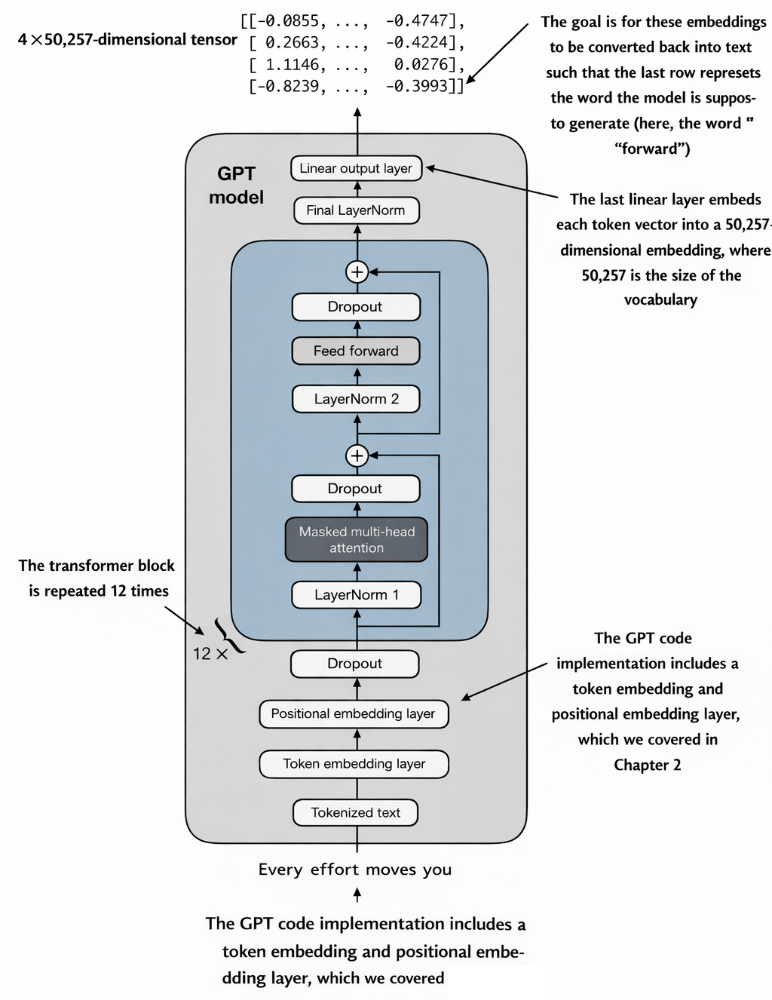

In [ ]:
class GPTModel(nn.Module):

  def __init__(self, cfg):
    super().__init__()
    self.tok_emb = nn.Embedding(cfg["vocab_size"], cfg["emb_dim"])
    self.pos_emb = nn.Embedding(cfg["context_length"], cfg["emb_dim"])
    self.drop_emb = nn.Dropout(cfg["drop_rate"])
    self.trf_blocks = nn.Sequential(*[TransformerBlock(cfg) for _ in range(cfg["n_layers"])])
    self.final_norm = LayerNorm(cfg["emb_dim"])
    self.out_head = nn.Linear(cfg["emb_dim"], cfg["vocab_size"], bias=False)

  def forward(self, in_idx):
    batch_size, seq_len = in_idx.shape
    tok_embeds = self.tok_emb(in_idx)
    pos_embeds = self.pos_emb(torch.arange(seq_len, device=in_idx.device))
    x = tok_embeds + pos_embeds # (batch_size, num_tokens, emb_size)
    x = self.drop_emb(x)
    x = self.trf_blocks(x)
    x = self.final_norm(x)
    logits = self.out_head(x)
    return logits

In [ ]:
torch.manual_seed(42)
model = GPTModel(GPT_CONFIG_124M)

out = model(batch)
print("Input shape:", batch.shape)
print("Input batch:\n", batch)
print("\nOutput shape:", out.shape)
print(out)

Input shape: torch.Size([2, 4])
Input batch:
 tensor([[6109, 3626, 6100,  345],
        [6109, 1110, 6622,  257]])

Output shape: torch.Size([2, 4, 50257])
tensor([[[-0.9407,  0.0300,  0.3015,  ..., -0.8873, -0.3914,  0.3496],
         [ 0.0791, -0.2978,  0.5970,  ...,  0.1537, -0.3366, -0.5947],
         [-0.7017,  0.4230,  0.2424,  ...,  1.0373,  0.1234, -0.4585],
         [ 0.0820,  0.6503,  0.1973,  ...,  0.3610, -1.1243, -0.0603]],

        [[-0.8006,  0.1830, -0.4456,  ..., -1.3904, -0.0753,  0.3379],
         [ 0.6536,  0.1862,  0.0282,  ..., -0.1115,  0.0174, -0.4057],
         [-0.3667,  0.9512,  0.5912,  ...,  1.2047,  0.1803,  1.3873],
         [-0.4791, -0.5409,  1.5950,  ...,  0.4151, -0.1852, -0.6393]]],
       grad_fn=<UnsafeViewBackward0>)


In [ ]:
# model params
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params:,}")

Total number of parameters: 163,009,536


In [ ]:
# notice we get 163M and not 124M as the original GPT model
# in the orignal implementation, some weight sharing happens so the embedding and output layer have the same number of weight parameters

# sanity check
print("Token embedding layer shape:", model.tok_emb.weight.shape)
print("Output layer shape:", model.out_head.weight.shape)

# if we subtract the number of parameters of the output layer, we'd get a 124M parameter model
total_params_gpt2 =  total_params - sum(p.numel() for p in model.out_head.parameters())
print(f"Number of trainable parameters considering weight tying: {total_params_gpt2:,}")

Token embedding layer shape: torch.Size([50257, 768])
Output layer shape: torch.Size([50257, 768])
Number of trainable parameters considering weight tying: 124,412,160


In [ ]:
# calculate the total size in bytes (assuming float32, 4 bytes per parameter)
total_size_bytes = total_params * 4

# convert to megabytes
total_size_mb = total_size_bytes / (1024 * 1024)

print(f"Total size of the model: {total_size_mb:.2f} MB")

Total size of the model: 621.83 MB


### Generate text

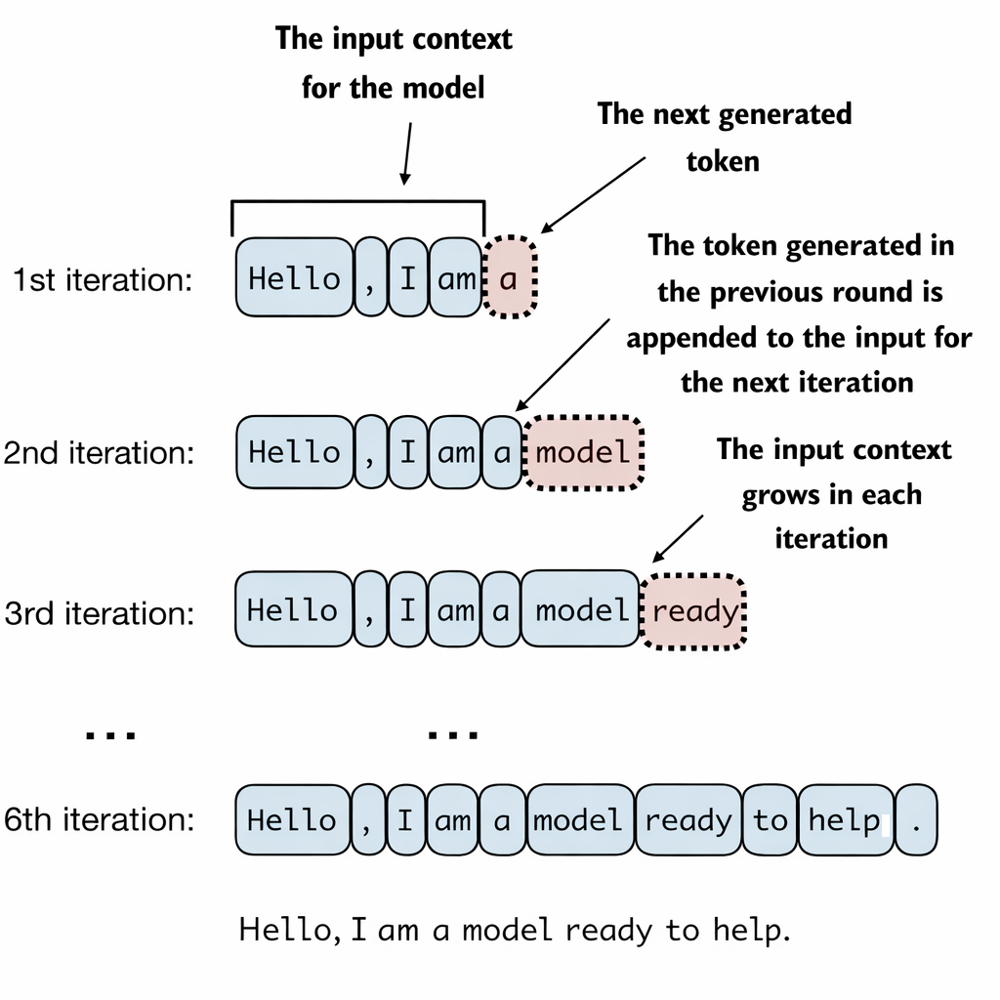

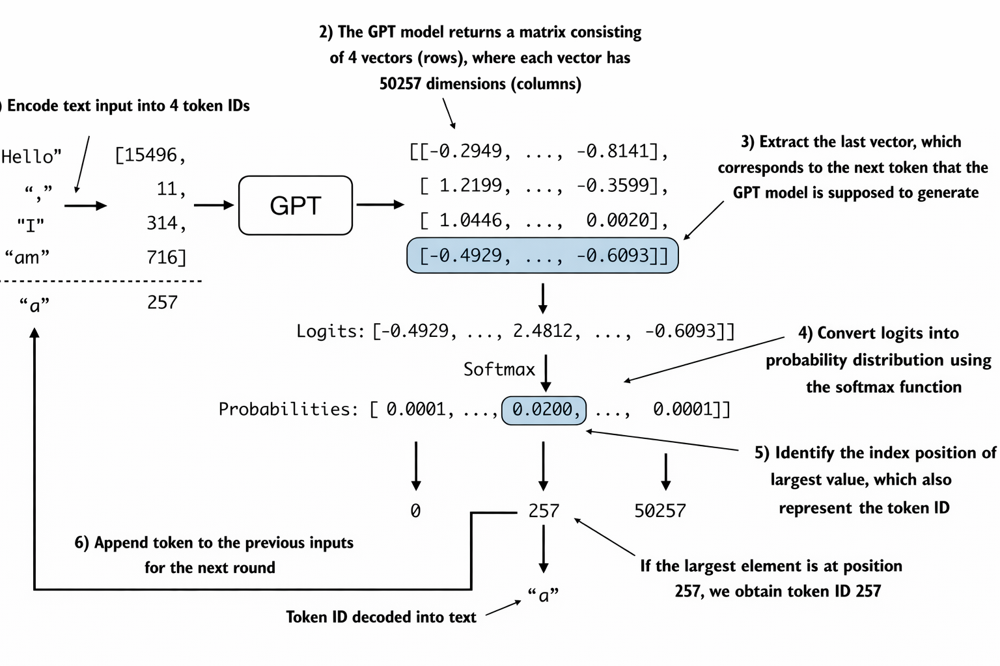

In [ ]:
def generate_text_simple(model, idx, max_new_tokens, context_size):
  # idx is (batch, n_tokens) array of indices in the current context
  for _ in range(max_new_tokens):

    # crop current context if it exceeds the supported context size
    # e.g., if LLM supports only 5 tokens, and the context size is 10 then only the last 5 tokens are used as context
    idx_cond = idx[:, -context_size:]

    # get the predictions
    with torch.no_grad():
      logits = model(idx_cond)

    # focus only on the last time step
    # (batch, n_tokens, vocab_size) becomes (batch, vocab_size)
    logits = logits[:, -1, :]

    # apply softmax to get probabilities
    probas = torch.softmax(logits, dim=-1) # (batch, vocab_size)

    # get the idx of the vocab entry with the highest probability value
    idx_next = torch.argmax(probas, dim=-1, keepdim=True) # (batch, 1)

    # append sampled index to the running sequence
    idx = torch.cat((idx, idx_next), dim=1) # (batch, n_tokens+1)

  return idx

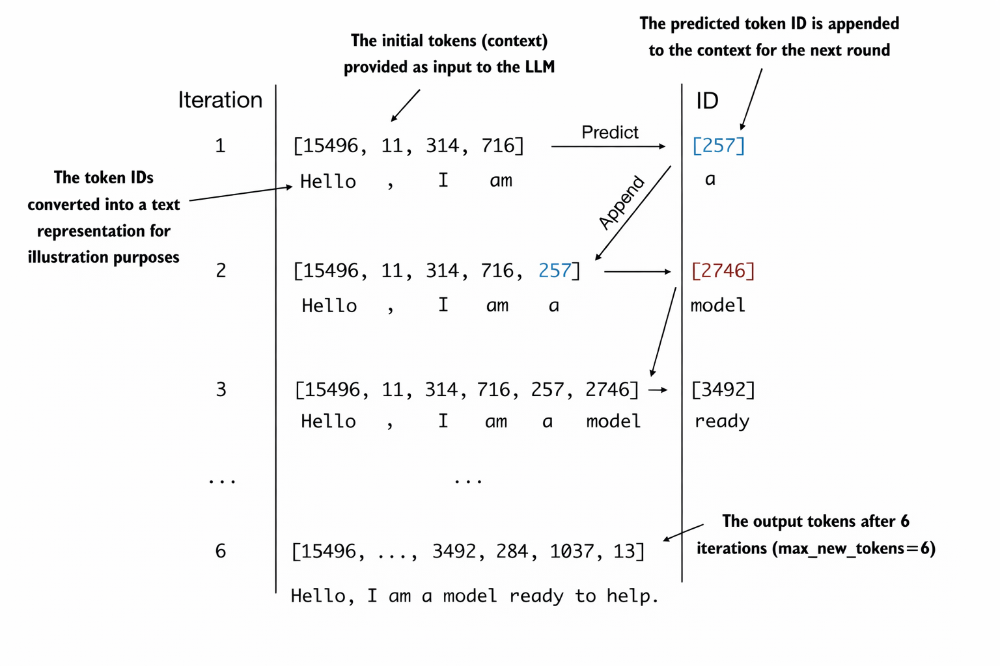

In [ ]:
# let's test it
start_context = "Hello, I am"

encoded = tokenizer.encode(start_context)
print("encoded:", encoded)

encoded_tensor = torch.tensor(encoded).unsqueeze(0)
print("encoded_tensor.shape:", encoded_tensor.shape)

encoded: [15496, 11, 314, 716]
encoded_tensor.shape: torch.Size([1, 4])


In [ ]:
model.eval()

out = generate_text_simple(
    model=model,
    idx=encoded_tensor,
    max_new_tokens=6,
    context_size=GPT_CONFIG_124M["context_length"]
)

print("Output:", out)
print("Output length:", len(out[0]))

Output: tensor([[15496,    11,   314,   716,  4754, 22091, 43072, 19101, 14187, 41501]])
Output length: 10


In [ ]:
decoded_text = tokenizer.decode(out.squeeze(0).tolist())
print(decoded_text)

Hello, I amulf Kai cog Portugal paStudio
